In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from IPython.display import Image

In [2]:
cv2.__version__

'4.6.0'

In [45]:
cb_img = cv2.imread("Desktop/checkerboard_18x18.png",0)

# Print the image data (pixel values), element of a 2D numpy array.
# Each pixel value is 8-bits [0,255]
print(cb_img)

[[  0   0   0   0   0   0 255 255 255 255 255 255   0   0   0   0   0   0]
 [  0   0   0   0   0   0 255 255 255 255 255 255   0   0   0   0   0   0]
 [  0   0   0   0   0   0 255 255 255 255 255 255   0   0   0   0   0   0]
 [  0   0   0   0   0   0 255 255 255 255 255 255   0   0   0   0   0   0]
 [  0   0   0   0   0   0 255 255 255 255 255 255   0   0   0   0   0   0]
 [  0   0   0   0   0   0 255 255 255 255 255 255   0   0   0   0   0   0]
 [255 255 255 255 255 255   0   0   0   0   0   0 255 255 255 255 255 255]
 [255 255 255 255 255 255   0   0   0   0   0   0 255 255 255 255 255 255]
 [255 255 255 255 255 255   0   0   0   0   0   0 255 255 255 255 255 255]
 [255 255 255 255 255 255   0   0   0   0   0   0 255 255 255 255 255 255]
 [255 255 255 255 255 255   0   0   0   0   0   0 255 255 255 255 255 255]
 [255 255 255 255 255 255   0   0   0   0   0   0 255 255 255 255 255 255]
 [  0   0   0   0   0   0 255 255 255 255 255 255   0   0   0   0   0   0]
 [  0   0   0   0   0   0

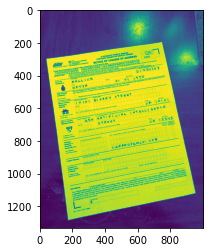

In [3]:
plt.imshow(cb_img)

In [9]:
Image("Desktop/checkerboard_18x18.png")

In [10]:
coke_img_channels_reversed = cb_img[:, ::-1]

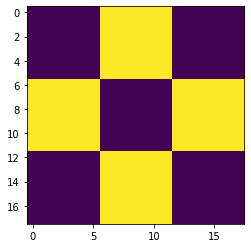

In [15]:
plt.imshow(coke_img_channels_reversed)

In [3]:
import numpy

In [16]:
import cv2
import numpy as np

cap = cv2.VideoCapture(0)
cv2.namedWindow("main", cv2.WINDOW_NORMAL)
#cv2.resizeWindow('main', 1280, 960) 
width = cap.get(cv2.CAP_PROP_FRAME_WIDTH)
height = cap.get(cv2.CAP_PROP_FRAME_HEIGHT)
print(width, height)

while True:
    ret, frame = cap.read()
    #frame = cv2.flip(frame,1)
    cv2.imshow('main', frame)
    
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break
        
cap.release()
cv2.destroyAllWindows()

640.0 480.0


In [14]:
PREVIEW  = 0   # Preview Mode
BLUR     = 1   # Blurring Filter
FEATURES = 2   # Corner Feature Detector
CANNY    = 3   # Canny Edge Detector

feature_params = dict( maxCorners = 500,
                       qualityLevel = 0.2,
                       minDistance = 15,
                       blockSize = 9)


image_filter = PREVIEW
alive = True

win_name = 'Camera Filters'
cv2.namedWindow(win_name, cv2.WINDOW_NORMAL)
cv2.resizeWindow(win_name, 1280, 960) 
result = None

source = cv2.VideoCapture(0)

while alive:
    has_frame, frame = source.read()
    if not has_frame:
        break

    frame = cv2.flip(frame,1)

    if image_filter == PREVIEW:
        result = frame
    elif image_filter == CANNY:
        result = cv2.Canny(frame, 80, 150)
    elif image_filter == BLUR:
        result = cv2.blur(frame, (13,13))
    elif image_filter == FEATURES:
         result = frame
         frame_gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
         corners = cv2.goodFeaturesToTrack(frame_gray, **feature_params)
         if corners is not None:
             for x, y in numpy.float32(corners).reshape(-1, 2):
                 cv2.circle(result, (x,y), 10, (0, 255 , 0), 1)

    cv2.imshow(win_name, result)

    key = cv2.waitKey(1)
    if key == ord('Q') or key == ord('q') or key == 27:
        alive = False
    elif key == ord('C') or key == ord('c'):
        image_filter = CANNY
    elif key == ord('B') or key == ord('b'):
        image_filter = BLUR
    elif key == ord('F') or key == ord('f'):
        image_filter = FEATURES
    elif key == ord('P') or key == ord('p'):
        image_filter = PREVIEW

source.release()
cv2.destroyWindow(win_name)


In [13]:
# Read reference image
refFilename = "Desktop/form.jpg"
print("Reading reference image : ", refFilename)
im1 = cv2.imread(refFilename, cv2.IMREAD_COLOR)
im1 = cv2.cvtColor(im1, cv2.COLOR_BGR2RGB)

# Read image to be aligned
imFilename = "Desktop/scanned-form.jpg"
print("Reading image to align : ", imFilename)
im2 = cv2.imread(imFilename, cv2.IMREAD_COLOR)
im2 = cv2.cvtColor(im2, cv2.COLOR_BGR2RGB)

Reading reference image :  Desktop/form.jpg
Reading image to align :  Desktop/scanned-form.jpg


Text(0.5, 1.0, 'Scanned Form')

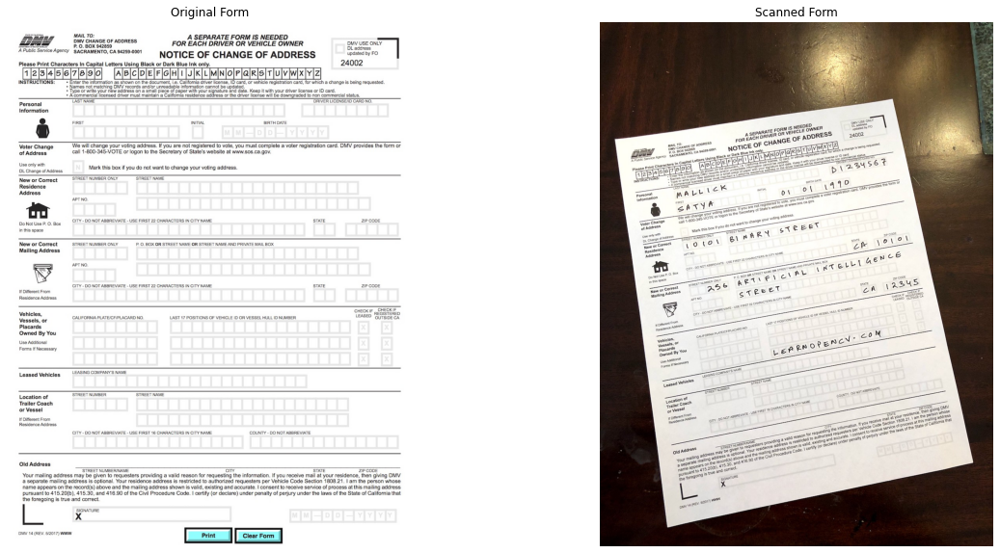

In [3]:
plt.figure(figsize=[20,10]); 
plt.subplot(121); plt.axis('off'); plt.imshow(im1); plt.title("Original Form")
plt.subplot(122); plt.axis('off'); plt.imshow(im2); plt.title("Scanned Form")

In [4]:
im1_gray = cv2.cvtColor(im1, cv2.COLOR_BGR2GRAY)
im2_gray = cv2.cvtColor(im2, cv2.COLOR_BGR2GRAY)

In [5]:
MAX_NUM_FEATURES = 500
orb = cv2.ORB_create(MAX_NUM_FEATURES)
keypoints1, descriptors1 = orb.detectAndCompute(im1_gray, None)
keypoints2, descriptors2 = orb.detectAndCompute(im2_gray, None)

# Display 
im1_display = cv2.drawKeypoints(im1, keypoints1, outImage=np.array([]), color=(255, 0, 0), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
im2_display = cv2.drawKeypoints(im2, keypoints2, outImage=np.array([]), color=(255, 0, 0), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)


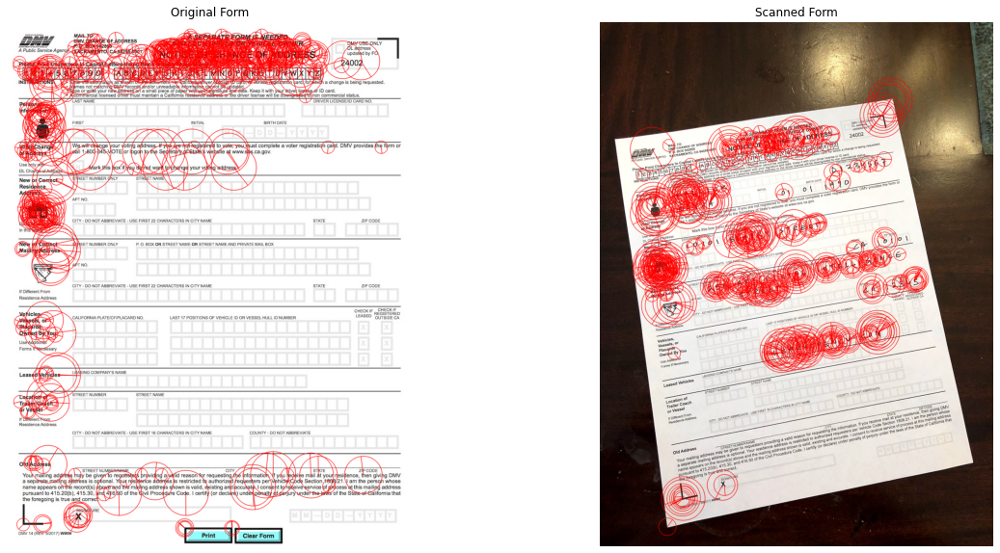

In [6]:
plt.figure(figsize=[20,10])
plt.subplot(121); plt.axis('off'); plt.imshow(im1_display); plt.title("Original Form");
plt.subplot(122); plt.axis('off'); plt.imshow(im2_display); plt.title("Scanned Form");

In [15]:
# Match features.
matcher = cv2.DescriptorMatcher_create(cv2.DESCRIPTOR_MATCHER_BRUTEFORCE_HAMMING)
matches = matcher.match(descriptors1, descriptors2, None)
  


In [17]:
matches=[*matches]

In [19]:
matches.sort(key=lambda x: x.distance, reverse=False)

# Remove not so good matches
numGoodMatches = int(len(matches) * 0.1)
matches = matches[:numGoodMatches]

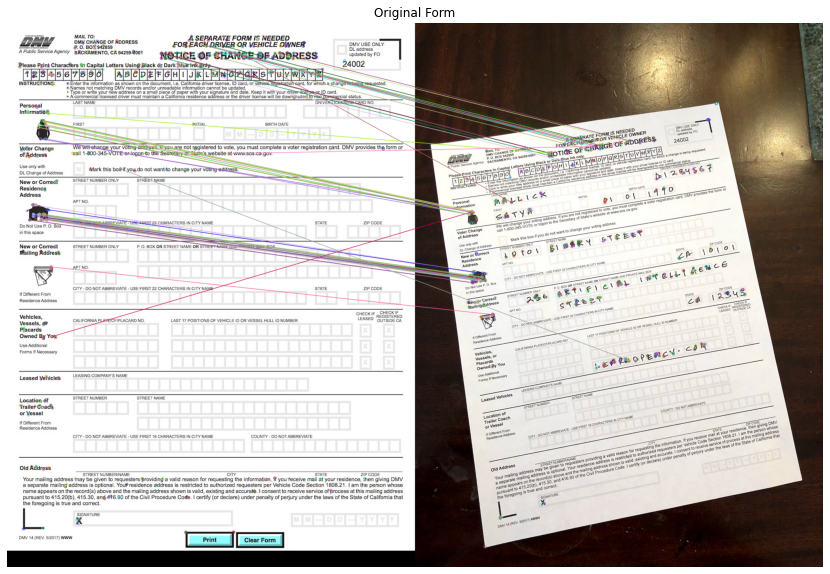

In [20]:
im_matches = cv2.drawMatches(im1, keypoints1, im2, keypoints2, matches, None)

plt.figure(figsize=[40,10])
plt.imshow(im_matches); plt.axis('off'); plt.title("Original Form");

In [21]:
# Extract location of good matches
points1 = np.zeros((len(matches), 2), dtype=np.float32)
points2 = np.zeros((len(matches), 2), dtype=np.float32)

for i, match in enumerate(matches):
  points1[i, :] = keypoints1[match.queryIdx].pt
  points2[i, :] = keypoints2[match.trainIdx].pt
  
# Find homography
h, mask = cv2.findHomography(points2, points1, cv2.RANSAC)

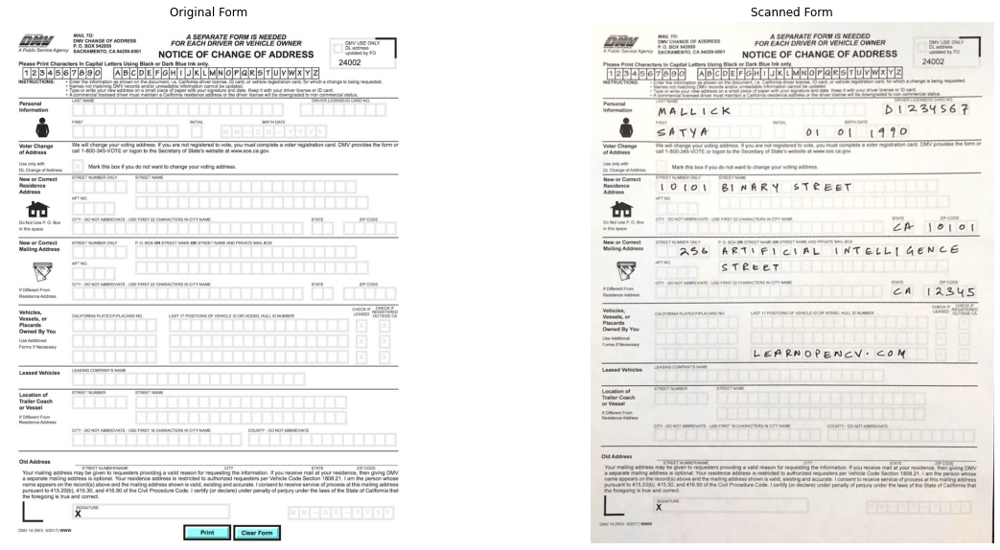

In [22]:
height, width, channels = im1.shape
im2_reg = cv2.warpPerspective(im2, h, (width, height))
# Display results 
plt.figure(figsize=[20,10]); 
plt.subplot(121); plt.imshow(im1); plt.axis('off'); plt.title("Original Form");
plt.subplot(122); plt.imshow(im2_reg); plt.axis('off'); plt.title("Scanned Form");

In [2]:
import glob
import math

In [28]:
imagefiles = glob.glob("Desktop/boat/*")

In [29]:
images = []
for filename in imagefiles:
  img = cv2.imread(filename)
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  images.append(img)

num_images = len(images)

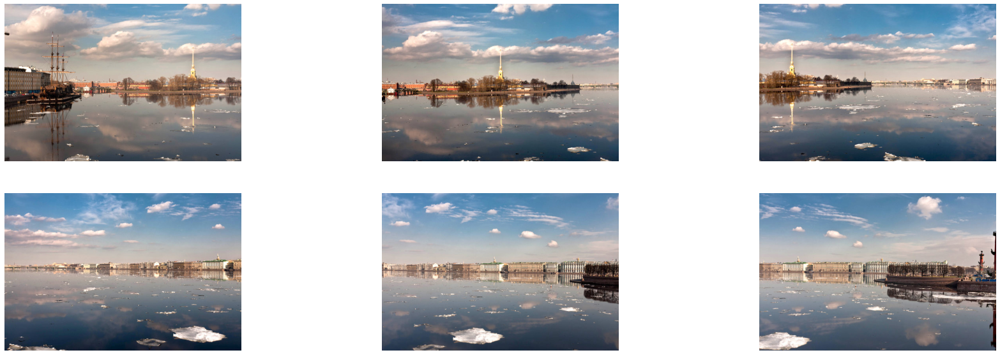

In [30]:
plt.figure(figsize=[30,10]) 
num_cols = 3
num_rows = math.ceil(num_images / num_cols)
for i in range(0, num_images):
  plt.subplot(num_rows, num_cols, i+1) 
  plt.axis('off')
  plt.imshow(images[i])

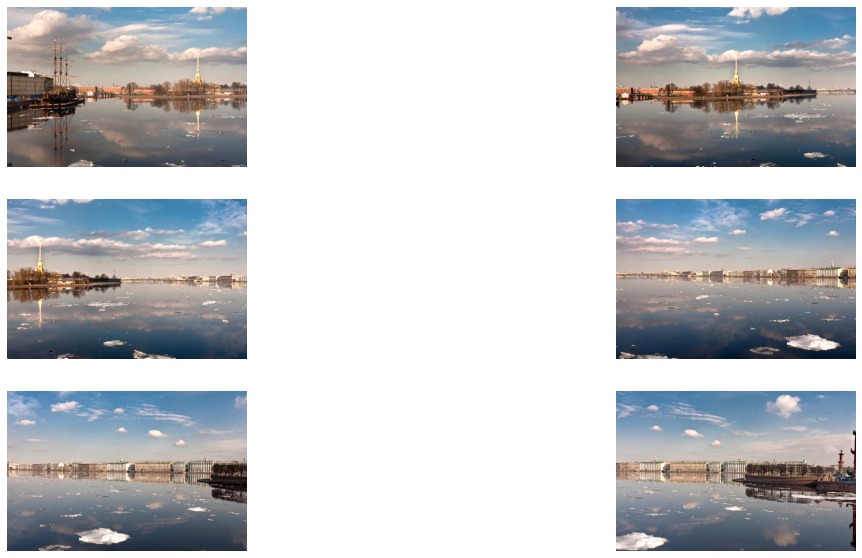

In [31]:
plt.figure(figsize=[20,10]) 
num_cols = 2
num_rows = math.ceil(num_images / num_cols)
for i in range(0, num_images):
  plt.subplot(num_rows, num_cols, i+1) 
  plt.axis('off')
  plt.imshow(images[i])

In [2]:
img = cv2.imread("Desktop/boat2.jpg",1)

In [3]:
cv2.imshow("Image", img)
cv2.waitKey(0)
cv2.destroyAllWindows()


In [4]:
img.shape

(400, 600, 3)

In [5]:
img1 = cv2.imread("Desktop/boat2.jpg",0)

cv2.imshow("Image1", img1)
cv2.waitKey(0)
cv2.destroyAllWindows()

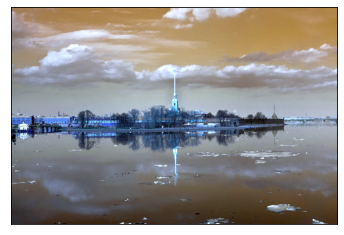

In [7]:

plt.imshow(img)
plt.xticks([]), plt.yticks([]) # to hide tick values on X and Y axis
plt.show()

In [8]:
im_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

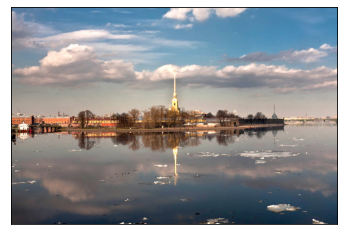

In [9]:
plt.imshow(im_rgb)
plt.xticks([]), plt.yticks([]) # to hide tick values on X and Y axis
plt.show()

In [45]:
cap = cv2.VideoCapture(0)
w = cap.get(cv2.CAP_PROP_FRAME_WIDTH);
h = cap.get(cv2.CAP_PROP_FRAME_HEIGHT)
fourcc = cv2.VideoWriter_fourcc(*'DIVX')
out = cv2.VideoWriter('output.mp4', fourcc, 20.0, (int(w),int(h)))

while True:
    ret, frame = cap.read()
    out.write(frame)
    cv2.imshow('video feed', frame)
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

cap.release()
out.release()
cv2.destroyAllWindows()

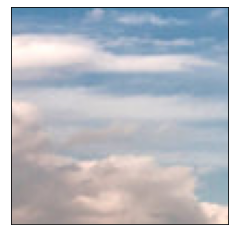

In [11]:
roi = im_rgb[30:130,140:240]
plt.imshow(roi)
plt.xticks([]), plt.yticks([]) # to hide tick values on X and Y axis
plt.show()

In [12]:
(B, G, R) = cv2.split(img)

([], [])

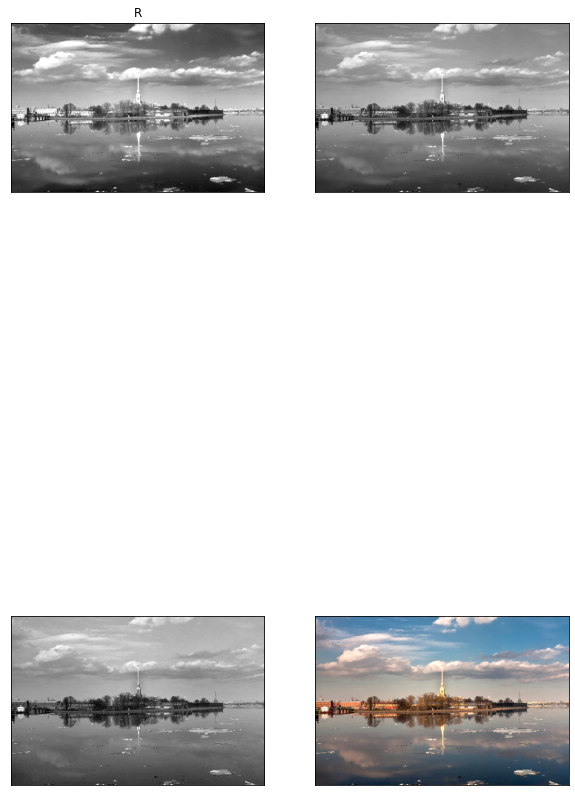

In [28]:
plt.figure(figsize=[10,20])
plt.subplot(221)
plt.imshow(R,cmap='gray')
plt.title('R')
plt.xticks([])
plt.yticks([])
plt.subplot(222)
plt.imshow(G,cmap='gray')
plt.xticks([])
plt.yticks([])
plt.subplot(223)
plt.imshow(B,cmap='gray')
plt.xticks([])
plt.yticks([])
plt.subplot(224)
plt.imshow(im_rgb)
plt.xticks([])
plt.yticks([])


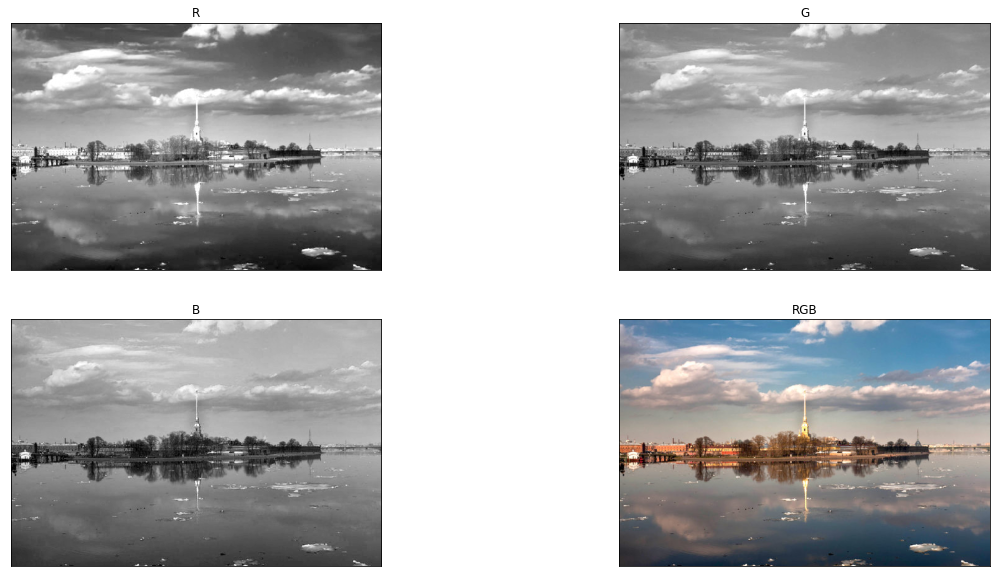

In [15]:
fig,axes=plt.subplots(figsize=(20,10),nrows = 2, ncols =2)
axes[0,0].imshow(R,cmap='gray')
axes[0,1].imshow(G,cmap='gray')
axes[1,0].imshow(B,cmap='gray')
axes[1,1].imshow(im_rgb)
axes[0, 0].set(title='R')
axes[0, 1].set(title='G')
axes[1, 0].set(title='B')
axes[1, 1].set(title='RGB')
for ax in axes.flat:
    ax.set_yticks([])
    ax.set_xticks([])



In [29]:
zeros = np.zeros((im_rgb.shape[0], im_rgb.shape[1]), dtype=np.uint8)

In [30]:
merged = cv2.merge([B, G, zeros])

In [42]:
merged.dtype

dtype('uint8')

([], [])

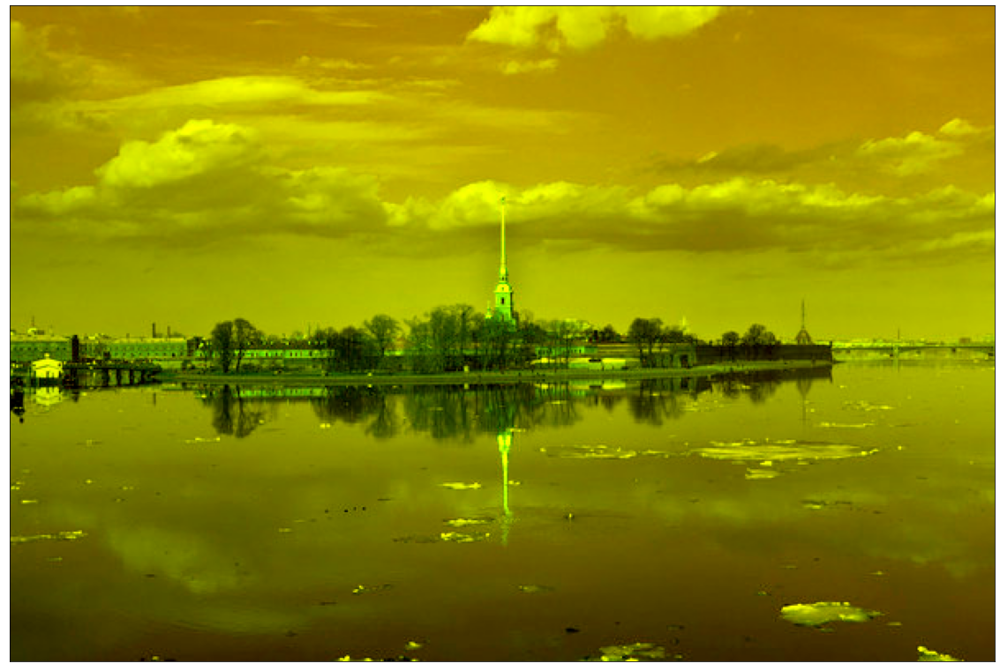

In [57]:
plt.figure(figsize=(20,40))
plt.imshow(merged)
plt.xticks([])
plt.yticks([])

In [33]:
from skimage.util import random_noise

In [63]:
noised=random_noise(im_rgb, mode='gaussian')

([], [])

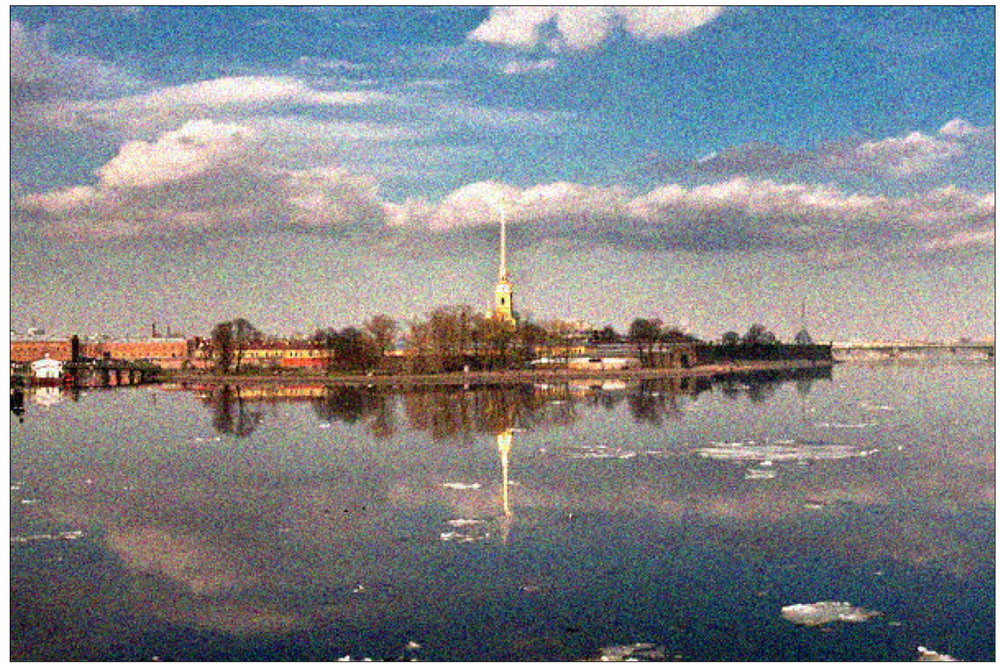

In [64]:
plt.figure(figsize=(20,40))
plt.imshow(noised)
plt.xticks([])
plt.yticks([])

In [72]:
from skimage.util import img_as_ubyte

In [73]:
noised = img_as_ubyte(noised)

In [74]:
noised.dtype

dtype('uint8')

In [68]:
h = 10  
hColor = 10
templateWindowSize = 7
searchWindowSize = 21

In [75]:
denoised = cv2.fastNlMeansDenoisingColored(noised,None,h,hColor,templateWindowSize,searchWindowSize)

([], [])

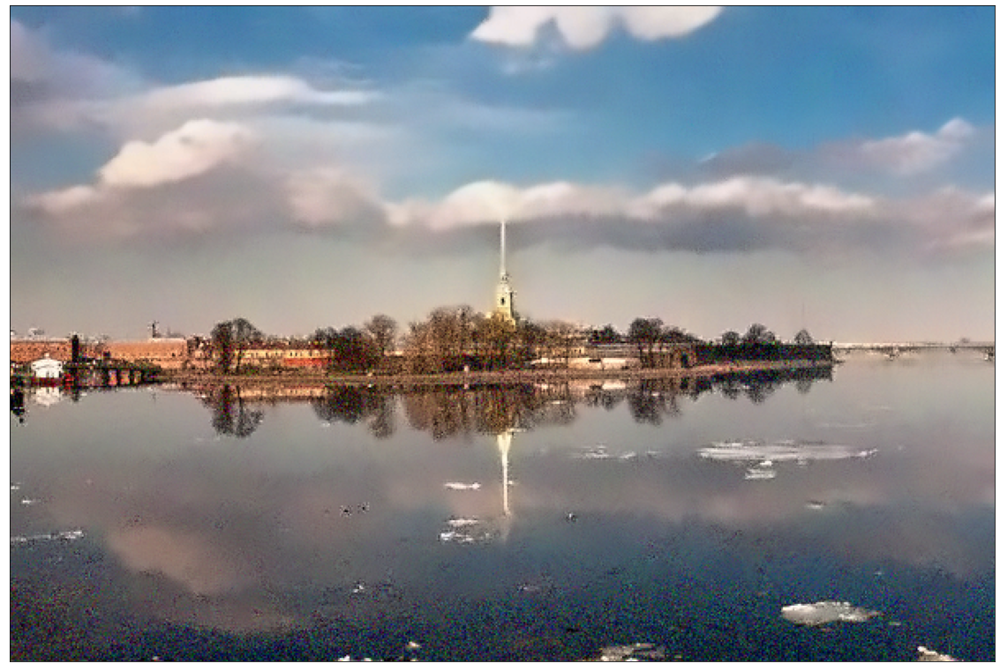

In [76]:
plt.figure(figsize=(20,40))
plt.imshow(denoised)
plt.xticks([])
plt.yticks([])

In [2]:
img=cv2.imread("Desktop/203-2033166_checkerboard-circle-circular-chess-board.png",0)

In [23]:
kernel = np.ones((2,2),np.uint8)

dilated = cv2.dilate(img,kernel,iterations = 5)
eroded = cv2.erode(img,kernel,iterations = 5)

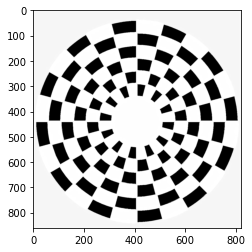

In [14]:
plt.imshow(dilated, cmap='gray')

[Text(0.5, 1.0, 'eroded')]

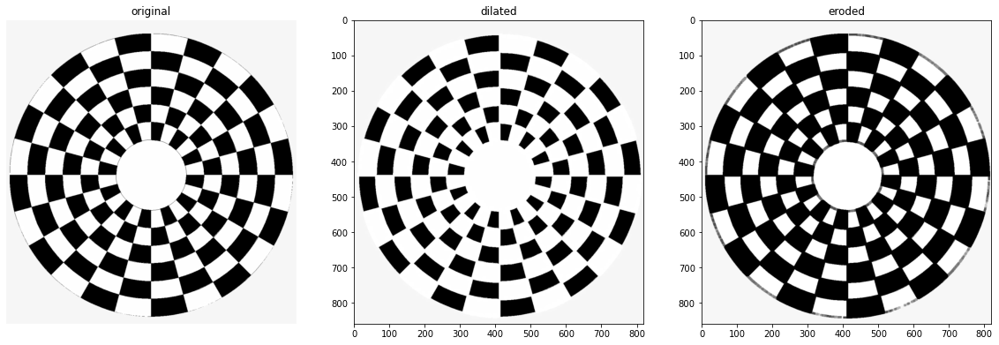

In [26]:
fig, axes=plt.subplots(figsize=(20,10),nrows=1, ncols=3)
axes[0].imshow(img, cmap='gray')
axes[0].set(title='original')
axes[0].axis('off')
axes[1].imshow(dilated, cmap='gray')
axes[1].set(title='dilated')
axes[2].imshow(eroded, cmap='gray')
axes[2].set(title='eroded')

In [2]:
img1 = cv2.imread("Desktop/boat2.jpg",1)

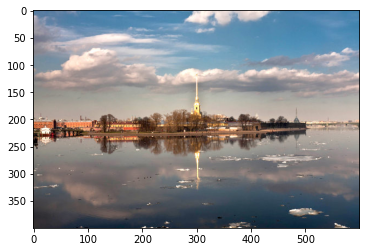

In [3]:
img2 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
plt.imshow(img2)


In [4]:
rows, cols, dim = img2.shape

In [11]:
rows

400

In [5]:
M = np.float32([ [-1, 0, cols],
                [0, 1, 0] ])

In [6]:
translated_img = cv2.warpAffine(img2, M, (cols, rows))

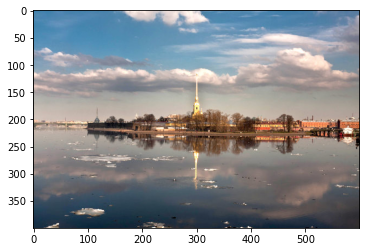

In [7]:
plt.imshow(translated_img)

In [8]:
M = np.float32([ [1, 0, 0],
                [0, -1, rows] ])

In [9]:
translated_img = cv2.warpAffine(img2, M, (cols, rows))

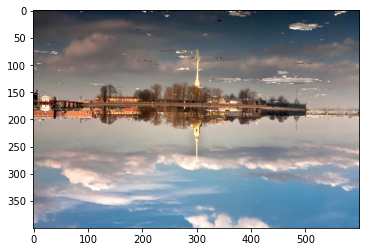

In [10]:
plt.imshow(translated_img)

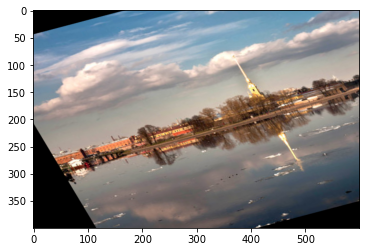

In [16]:
pts_in = np.float32([[50,50],[200,50],[50,200]])
pts_out = np.float32([[10,100],[200,50],[100,250]])

M = cv2.getAffineTransform(pts_in,pts_out)
img3 = cv2.warpAffine(img2,M,(cols,rows))
plt.imshow(img3)

In [44]:
    center = (int(cols / 2), int(rows / 2))
    M = cv2.getRotationMatrix2D(center, -45, 0.6)

In [46]:
translated_img = cv2.warpAffine(img2, M, (cols, rows))

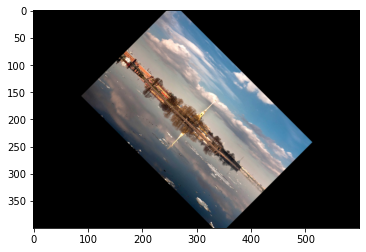

In [47]:
plt.imshow(translated_img)

In [29]:
angle = np.radians(50)
#transformation matrix for Rotation
M = np.float32([[np.cos(angle), -(np.sin(angle)), 100],
               [np.sin(angle), np.cos(angle), 100],
               [0, 0, 1]])

In [30]:
translated_img = cv2.warpPerspective(img2, M, (cols*2, rows*2))

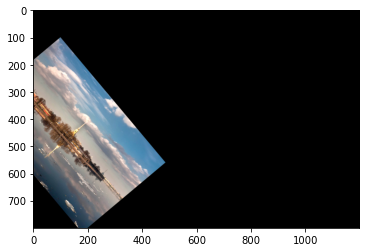

In [31]:
plt.imshow(translated_img)

In [40]:
src_points = np.float32([[0,0], [cols-1,0], [0,rows-1], [cols-1,rows-1]])
dst_points = np.float32([[0,0], [cols-1,0], [int(0.33*cols),rows-1], [int(0.66*cols),rows-1]])
M= cv2.getPerspectiveTransform(src_points, dst_points)

In [41]:
M

array([[ 1.        ,  1.50125313,  0.        ],
       [ 0.        ,  3.02525253,  0.        ],
       [-0.        ,  0.00507582,  1.        ]])

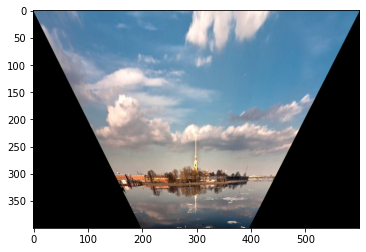

In [42]:
translated_img = cv2.warpPerspective(img2, M, (cols*2, rows*2))
plt.imshow(translated_img)

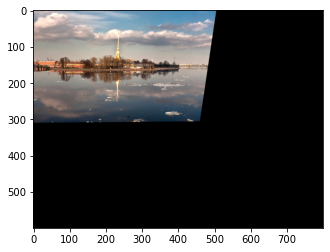

In [20]:
pts_in = np.float32([[56,65],[368,52],[28,387],[389,390]])
pts_out = np.float32([[0,0],[300,0],[0,300],[300,300]])

M = cv2.getPerspectiveTransform(pts_in,pts_out)
img4 = cv2.warpPerspective(img2,M,(rows*2,cols))
plt.imshow(img4)

In [59]:

while True:
    k = cv2.waitKey(0)
    if k == ord('q'):
        break

    elif k == ord('v'):
        img2 = cv2.flip(img2, 0)

    elif k == ord('h'):
        img2 = cv2.flip(img2, 1)
 
    cv2.imshow('window', img2)

cv2.destroyAllWindows()

In [ ]:

img = cv2.resize(img2, None, fx=0.5, fy=0.5, interpolation=cv2.INTER_CUBIC)
M = np.ones(img.shape, dtype='uint8') * 40

brighter = cv2.add(img, M)
darker = cv2.subtract(img, M)

img3 = np.hstack([img, brighter, darker])

cv2.imshow('window', img3)
cv2.waitKey(0)
cv2.destroyAllWindows()

In [6]:
img4=cv2.resize(img2, None, fx=2,fy=2)

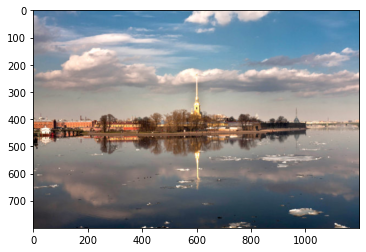

In [7]:
plt.imshow(img4)

In [8]:
img4=cv2.resize(img2,(100,200))

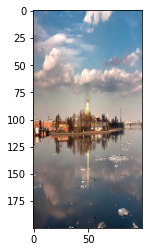

In [9]:
plt.imshow(img4)

In [11]:
r=100/img2.shape[1]

In [12]:
r

0.16666666666666666

In [13]:
h=img2.shape[0]*r

In [15]:
img4=cv2.resize(img2,dsize=(100,int(h)), interpolation=cv2.INTER_AREA)

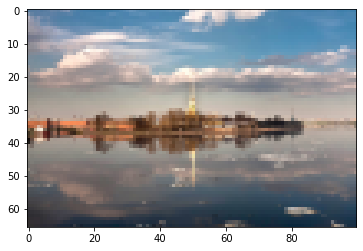

In [16]:
plt.imshow(img4)

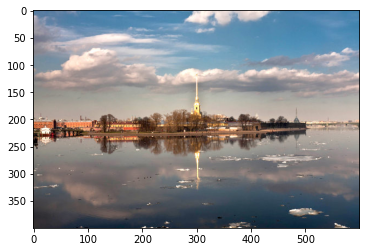

In [4]:
img2 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
plt.imshow(img2)

In [2]:
img1 = cv2.imread("Desktop/boat2.jpg",1)

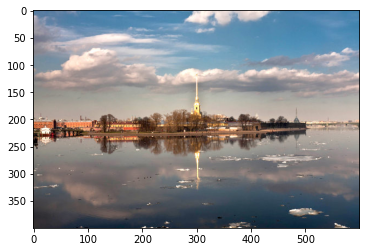

In [3]:
plt.imshow(img1[:,:,::-1])

In [5]:
imline=img1.copy()

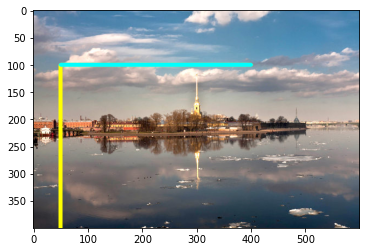

In [8]:
cv2.line(imline,(50,100),(400,100),(255,255,0),thickness=5,lineType=cv2.LINE_AA)
plt.imshow(imline[:,:,::-1])

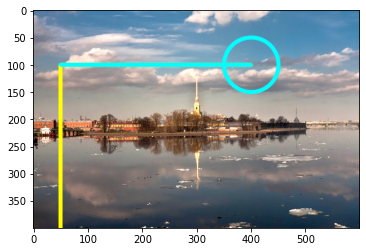

In [9]:
cv2.circle(imline,(400,100), 50, (255,255,0),thickness=5,lineType=cv2.LINE_AA)
plt.imshow(imline[:,:,::-1])

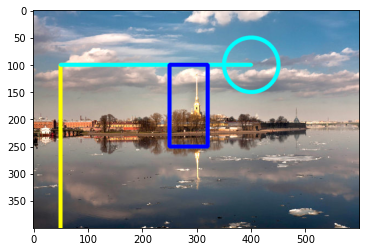

In [11]:
cv2.rectangle(imline,(250,100),(320, 250), (255,0,0),thickness=5,lineType=cv2.LINE_AA)
plt.imshow(imline[:,:,::-1])

In [12]:
text='Tower'

In [13]:
fontScale=3

In [14]:
fontFace=cv2.FONT_HERSHEY_PLAIN

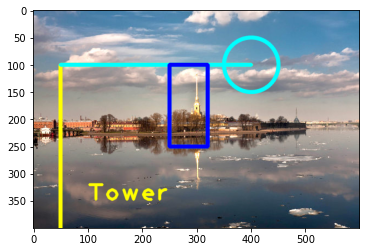

In [15]:
fontColor=(0,255,255)
fontThickness=3
cv2.putText(imline,text, (100,350),fontFace,fontScale,fontColor, fontThickness,cv2.LINE_AA)
plt.imshow(imline[:,:,::-1])

In [17]:
img2 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
r,g,b=cv2.split(img2)

Text(0.5, 1.0, 'org')

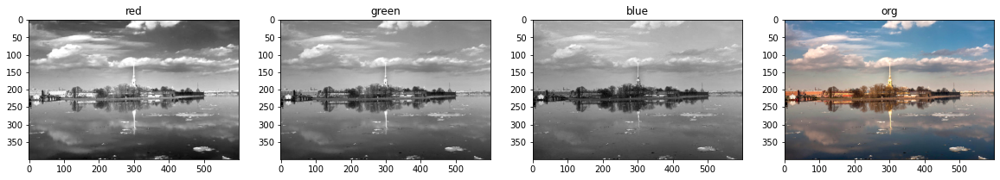

In [21]:
plt.figure(figsize=(20,10))
plt.subplot(141);plt.imshow(r, cmap='gray');plt.title('red')
plt.subplot(142);plt.imshow(g, cmap='gray');plt.title('green')
plt.subplot(143);plt.imshow(b, cmap='gray');plt.title('blue')
plt.subplot(144);plt.imshow(img2);plt.title('org')

In [3]:
img1 = cv2.imread("Desktop/boat2.jpg",1)

In [4]:
b,g,r=cv2.split(img1)

Text(0.5, 1.0, 'org')

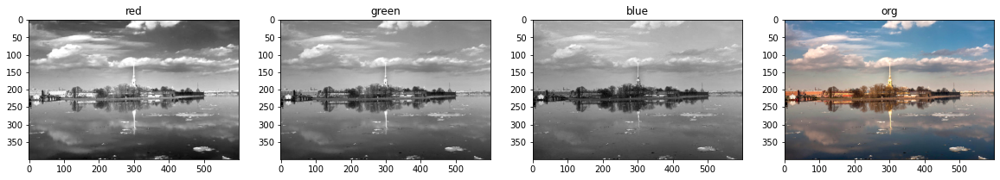

In [9]:
plt.figure(figsize=(20,10))
plt.subplot(141);plt.imshow(r, cmap='gray');plt.title('red')
plt.subplot(142);plt.imshow(g, cmap='gray');plt.title('green')
plt.subplot(143);plt.imshow(b, cmap='gray');plt.title('blue')
plt.subplot(144);plt.imshow(img1[:,:,::-1]);plt.title('org')

In [10]:
b=b+19

In [14]:
img2=cv2.merge((b,g,r))

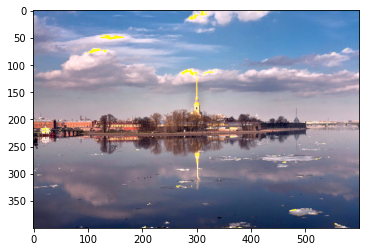

In [16]:
plt.imshow(img2[:,:,::-1])

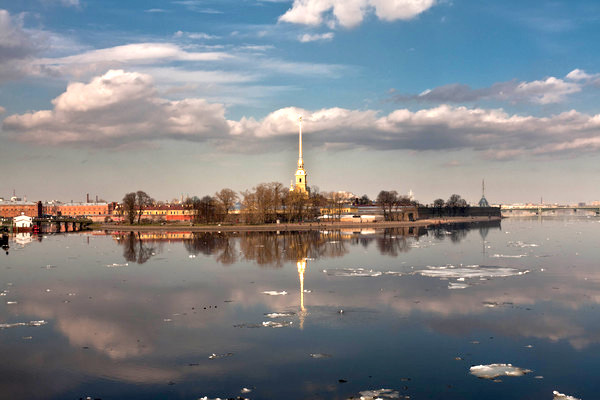

In [18]:
Image(filename="Desktop/boat2.jpg")

In [4]:
img2 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)

In [15]:
m=np.ones(img2.shape,dtype='uint8')*200

In [16]:
br=cv2.add(img2,m)
da=cv2.subtract(img2,m)

Text(0.5, 1.0, 'org')

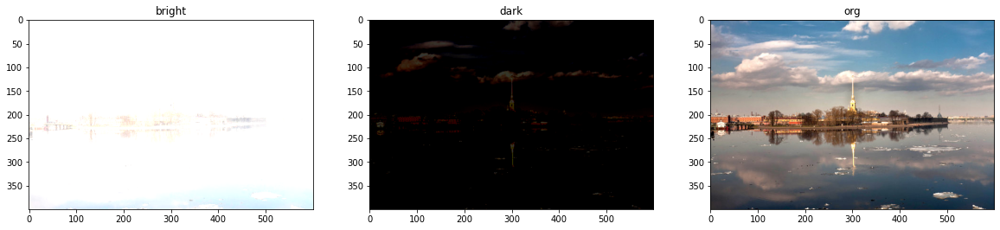

In [17]:
plt.figure(figsize=(20,10))
plt.subplot(131);plt.imshow(br); plt.title("bright")
plt.subplot(132);plt.imshow(da); plt.title("dark")
plt.subplot(133);plt.imshow(img2);plt.title('org')

In [3]:
cv2.namedWindow('window')

In [4]:
cv2.destroyWindow('window')

In [2]:
img1 = cv2.imread("Desktop/boat2.jpg",1)

In [5]:
while True:
    cv2.imshow('window_name', img1)
    
    if cv2.waitKey(1) & 0xFF == ord('q'): # Press q to quit
       break
        
cv2.destroyAllWindows()

In [21]:

import numpy as np

# mouse callback function
def draw_circle(event,x,y,flags,param):
    if event == cv2.EVENT_LBUTTONDBLCLK:
        cv2.circle(img,(x,y),50,(255,0,0),-1)

# Create a black image, a window and bind the function to window
img = img1
cv2.namedWindow('image')
cv2.setMouseCallback('image', draw_circle)

while(1):
    cv2.imshow('image',img)
    if cv2.waitKey(20) & 0xFF == 27 or cv2.waitKey(20) & 0xFF == ord('q'):
        break

cv2.destroyAllWindows()

In [24]:
drawing = False # true if mouse is pressed
mode = False # if True, draw rectangle. Press 'm' to toggle to curve
ix,iy = -1,-1

# mouse callback function
def draw_circle(event,x,y,flags,param):
    global ix,iy,drawing,mode

    if event == cv.EVENT_LBUTTONDOWN:
        drawing = True
        ix,iy = x,y

    elif event == cv.EVENT_MOUSEMOVE:
        if drawing == True:
            if mode == True:
                cv.rectangle(img,(ix,iy),(x,y),(0,255,0),-1)
            else:
                cv.circle(img,(x,y),5,(0,0,255),-1)

    elif event == cv.EVENT_LBUTTONUP:
        drawing = False
        if mode == True:
            cv.rectangle(img,(ix,iy),(x,y),(0,255,0),-1)
        else:
            cv.circle(img,(x,y),5,(0,0,255),-1)
            
img = np.zeros((512,512,3), np.uint8)
cv.namedWindow('image')
cv.setMouseCallback('image',draw_circle)

while(1):
    cv.imshow('image',img)
    k = cv.waitKey(1) & 0xFF
    if k == ord('m'):
        mode = not mode
    elif k == 27:
        break

cv.destroyAllWindows()

In [14]:

def mouse(event,x,y,flags,params):
    if event==cv2.EVENT_LBUTTONDOWN:
        circles.append((x,y))
cap = cv2.VideoCapture(0)
cv2.namedWindow("main", cv2.WINDOW_NORMAL)
#cv2.resizeWindow('main', 1280, 960) 
width = cap.get(cv2.CAP_PROP_FRAME_WIDTH)
height = cap.get(cv2.CAP_PROP_FRAME_HEIGHT)
print(width, height)
cv2.setMouseCallback('main', mouse)
circles=[]
while True:
    ret, frame = cap.read()
    #frame = cv2.flip(frame,1)
    for center_position in circles:
        cv2.circle(frame,center_position,10,(255,0,0),-1)
    cv2.imshow('main', frame)
    
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break
        
cap.release()
cv2.destroyAllWindows()

640.0 480.0


In [40]:
draw=False
p1=()
p2=()
def mouse(event,x,y,flags,params):
    global p1,p2,draw
    if event==cv2.EVENT_LBUTTONDOWN:
        if draw==False:
            draw=True
            p1=(x,y)
        else:
            draw=False
    elif event==cv2.EVENT_MOUSEMOVE:
        if draw==True:
            p2=(x,y)
        
cap = cv2.VideoCapture(0)
cv2.namedWindow("main", cv2.WINDOW_NORMAL)

cv2.setMouseCallback('main', mouse)
circles=[]
while True:
    ret, frame = cap.read()
    #frame = cv2.flip(frame,1)
    if p1 and p2:
        cv2.rectangle(frame,p1,p2,(0,0,255),2)

    cv2.imshow('main', frame)
    
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break
        
cap.release()
cv2.destroyAllWindows()

In [19]:
img1=cv2.imread('C:/Users/azpow/Desktop/boat2.jpg',1)

In [20]:
cv2.namedWindow("main", cv2.WINDOW_NORMAL)
while True:
    cv2.imshow('main', img1)
    
    if cv2.waitKey(1) & 0xFF == ord('q'): # Press q to quit
       break
        
cv2.destroyAllWindows()

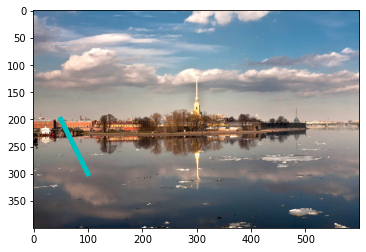

In [9]:
plt.imshow(img[:,:,::-1])
plt.plot([50,100],[200,300],'c', linewidth=5)

In [13]:
cap = cv2.VideoCapture(0)
cv2.namedWindow("main", cv2.WINDOW_NORMAL)
#cv2.resizeWindow('main', 1280, 960) 
width = cap.get(cv2.CAP_PROP_FRAME_WIDTH)
height = cap.get(cv2.CAP_PROP_FRAME_HEIGHT)
print(width, height)

while True:
    ret, frame = cap.read()
    frame1 = cv2.flip(frame,1)
    cv2.imshow('main1', frame1)
    frame0 = cv2.flip(frame,0)
    cv2.imshow('main0', frame0)
    cv2.imshow('main', frame)
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break
    

        
cap.release()
cv2.destroyAllWindows()

640.0 480.0


In [22]:
def mouse(event,x,y,flags,params):
    if event==cv2.EVENT_LBUTTONDOWN:
        circles.append((x,y))
cap = cv2.VideoCapture(0)
cv2.namedWindow("main", cv2.WINDOW_NORMAL)
cv2.setMouseCallback('main', mouse)
circles=[]
while True:
    ret, frame = cap.read()
    for center_position in circles:
        cv2.circle(frame,center_position,10,(255,0,0),-1)
    cv2.imshow('main',frame)
    pts1=np.float32([[155,45],[552,46],[192,187],[497,187]])
    pts2=np.float32([[0,0],[480,0],[0,640],[480,640]])
    M=cv2.getPerspectiveTransform(pts1,pts2)
    R=cv2.warpPerspective(frame,M,(480,640))
    cv2.imshow('main1', R)

    
  
    
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break
        
cap.release()
cv2.destroyAllWindows()

In [10]:
def nothing(x):
    pass
cv2.namedWindow('frame', cv2.WINDOW_NORMAL)
cv2.createTrackbar('test', 'frame',0, 100, nothing)
cv2.createTrackbar('flip','frame',0,1,nothing)

cap=cv2.VideoCapture(0)
while True:
    _,frame = cap.read()
    test=cv2.getTrackbarPos('test','frame')
    font=cv2.FONT_HERSHEY_COMPLEX
    cv2.putText(frame, str(test),(50,150),font,3,(0,0,255))
    s=cv2.getTrackbarPos('flip','frame')
    if s==0:
        pass
    else:
        frame=cv2.flip(frame, 0)
    cv2.imshow('frame',frame)
    if cv2.waitKey(1)& 0xFF==ord('q'):
        break
cap.release()
cv2.destroyAllWindows()    

In [24]:
img=np.array([
 [  255, 255,      0,   0,   0],
 [  255, 255,     0,   0,   0],
 [  255, 255,       0,   0 ,  0],
 [  255, 255,     0 ,  0  , 0],
 [  255, 255,      0 ,  0 ,  0],
 [  255, 255,     0 ,  0 ,  0]])
              

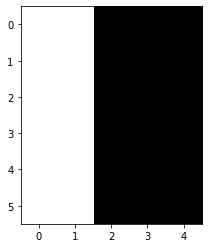

In [25]:
plt.imshow(img,cmap='gray')

In [32]:
img=np.array([
[
    [255,255,255],
    [200,200,200],
    [255,0,0],
    [255,0,0],
    [255,0,0],
],
[
    [255,255,0],
    [255,255,0],
    [255,255,0],
    [255,255,0],
    [255,255,0],
]
],np.uint8)

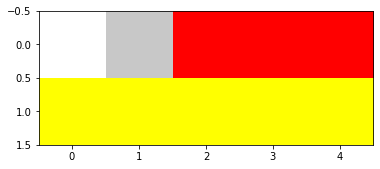

In [33]:
plt.imshow(img)

In [38]:
print(img)

[[[255   0   0]
  [255   0   0]
  [255   0   0]
  [255   0   0]
  [255   0   0]]

 [[255 255   0]
  [255 255   0]
  [255 255   0]
  [255 255   0]
  [255 255   0]]]


In [39]:
img.shape

(2, 5, 3)

In [40]:
img[1,3]=(0,0,255)

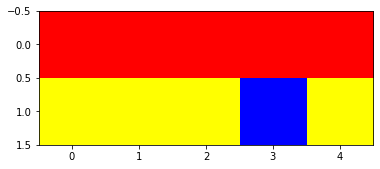

In [41]:
plt.imshow(img)

thresholding


In [23]:
img1=cv2.imread("checkerboard_color.png",1)
img2=cv2.imread("coca-cola-logo.png",1)

In [10]:
cv2.imshow('img1',img1)
cv2.imshow('img2',img2)
cv2.waitKey(0)
cv2.destroyAllWindows()

In [49]:
img1.shape, img2.shape

((1800, 1800, 3), (700, 700, 3))

In [24]:
img1=cv2.resize(img1,(700,700),interpolation=cv2.INTER_AREA)

In [55]:
img3=cv2.addWeighted(img1,0.5,img2,1,0)

In [56]:
cv2.imshow('sum',img3)
cv2.waitKey(0)
cv2.destroyAllWindows()

In [25]:
img2gray=cv2.cvtColor(img2,cv2.COLOR_BGR2GRAY)

In [26]:
_,mask_inv=cv2.threshold(img2gray,130,255,cv2.THRESH_BINARY_INV)
_,mask=cv2.threshold(img2gray,130,255,cv2.THRESH_BINARY)

In [29]:
cv2.imshow('img1',img1)
cv2.imshow('img2',img2)
cv2.imshow('mask',mask)
cv2.imshow('inv',mask_inv)
cv2.waitKey(0)
cv2.destroyAllWindows()

In [91]:
mask=cv2.cvtColor(mask,cv2.COLOR_GRAY2BGR)

In [92]:
img4=cv2.addWeighted(img1,0.5,mask,1,0)

In [95]:
cv2.imshow('summ',img4)
cv2.waitKey(0)
cv2.destroyAllWindows()

In [32]:
img3=cv2.bitwise_and(img1,img1,mask=mask)

In [34]:
img4=cv2.bitwise_and(img2,img2,mask=mask_inv)

In [39]:
cv2.imshow('img34',img4)
cv2.imshow('img3',img3)
cv2.waitKey(0)
cv2.destroyAllWindows()

In [36]:
img5=cv2.add(img3,img4)

In [40]:
cv2.imshow('img5',img5)
cv2.waitKey(0)
cv2.destroyAllWindows()

In [24]:
def nothing(x):
    pass
cap=cv2.VideoCapture(0)
cv2.namedWindow('trackbars')
cv2.createTrackbar('l-h','trackbars',0,179,nothing)
cv2.createTrackbar('l-c','trackbars',0,255,nothing)
cv2.createTrackbar('l-v','trackbars',0,255,nothing)
cv2.createTrackbar('u-h','trackbars',0,179,nothing)
cv2.createTrackbar('u-c','trackbars',0,255,nothing)
cv2.createTrackbar('u-v','trackbars',0,255,nothing)


while True:
    _,frame=cap.read()
    hcv=cv2.cvtColor(frame,cv2.COLOR_BGR2HSV)
    lh=cv2.getTrackbarPos('l-h','trackbars')
    lc=cv2.getTrackbarPos('l-c','trackbars')
    lv=cv2.getTrackbarPos('l-v','trackbars')
    uh=cv2.getTrackbarPos('u-h','trackbars')
    uc=cv2.getTrackbarPos('u-c','trackbars')
    uv=cv2.getTrackbarPos('u-v','trackbars')
    lb=np.array([lh,lc,lv])
    hb=np.array([uh,uc,uv])
    mask=cv2.inRange(hcv,lb,hb)
    contours =cv2.findContours(mask,cv2.RETR_TREE,cv2.CHAIN_APPROX_NONE)[0]
    cv2.drawContours(frame,contours,-1, (0, 255, 0),3)
    res=cv2.bitwise_and(frame,frame,mask=mask)
    cv2.imshow('main2', mask)
    cv2.imshow('main', frame)
    cv2.imshow('main3', res)
                        
                        
    
    if cv2.waitKey(1) & 0xFF == ord('q'): # Press q to quit
       break
cap.release()        
cv2.destroyAllWindows()

In [19]:
def nothing(x):
    pass
img=cv2.imread("C:/Users/azpow/Desktop/boat2.jpg",0)
img=cv2.resize(img,(700,700),interpolation=cv2.INTER_AREA)
cv2.namedWindow('tr')
cv2.createTrackbar('thresh','tr',0,255,nothing)

while True:
    result=cv2.getTrackbarPos('thresh','tr')
    _,res=cv2.threshold(img,result,255,cv2.THRESH_TOZERO_INV)
    cv2.imshow('image',img)                    
    cv2.imshow('image1',res)
    if cv2.waitKey(1) & 0xFF == ord('q'): # Press q to quit
       break      
cv2.destroyAllWindows()

In [10]:
img = cv2.imread("Desktop/boat2.jpg",1)

In [4]:
cv2.imshow('img',img)
cv2.waitKey(0)
cv2.destroyAllWindows()

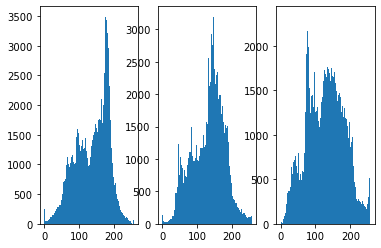

In [13]:
b,g,r=cv2.split(img)
plt.subplot(131)
plt.hist(b.ravel(),256,[0,256]);
plt.subplot(132)
plt.hist(g.ravel(),256,[0,256]);
plt.subplot(133)
plt.hist(r.ravel(),256,[0,256]);

In [ ]:
def nothing(x):
    pass
img=cv2.imread("C:/Users/azpow/Desktop/boat2.jpg",0)
img=cv2.resize(img,(700,700),interpolation=cv2.INTER_AREA)

cv2.namedWindow('tr')
cv2.createTrackbar('thresh','tr',0,255,nothing)
cv2.createTrackbar('threshmin','tr',0,255,nothing)

while True:
    result=cv2.getTrackbarPos('thresh','tr')
    result1=cv2.getTrackbarPos('threshmin','tr')
    m=np.ones(img.shape,dtype='uint8')*result
    m1=np.ones(img.shape,dtype='uint8')*result1
    br=cv2.add(img,m)
    br1=cv2.subtract(img,m1)
    cv2.imshow('image',img)                    
    cv2.imshow('image1',br)
    cv2.imshow('image2',br1)
    if cv2.waitKey(1) & 0xFF == ord('q'): # Press q to quit
       break      
cv2.destroyAllWindows()

In [3]:
img = cv2.imread("Desktop/Piano_Sheet_Music.png",0)

In [21]:
_,tresh=cv2.threshold(img,150,255,cv2.THRESH_BINARY)
ad=cv2.adaptiveThreshold(img,255,cv2.ADAPTIVE_THRESH_MEAN_C,cv2.THRESH_BINARY,11,5)
ad2=cv2.adaptiveThreshold(img,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C,cv2.THRESH_BINARY,11,5)
cv2.imshow('treshad2',ad2)
cv2.imshow('treshad',ad)
cv2.imshow('tresh',tresh)
cv2.imshow('image',img)
cv2.waitKey(0)
cv2.destroyAllWindows()

In [27]:
from skimage.util import random_noise
from skimage.util import img_as_ubyte

In [28]:
img1 = cv2.imread("Desktop/boat2.jpg",1)

In [29]:
noised=random_noise(img1, mode='gaussian')
noised = img_as_ubyte(noised)

In [30]:
cv2.imshow('image',img1)
cv2.imshow('image1',noised)
cv2.waitKey(0)
cv2.destroyAllWindows()

In [35]:
av=cv2.medianBlur(noised,5)
cv2.imshow('image3',av)
cv2.waitKey(0)
cv2.destroyAllWindows()

In [23]:
cv2.namedWindow('video1')
cap=cv2.VideoCapture(0)
while True:
    _,frame=cap.read()
    frame=cv2.cvtColor(frame,cv2.COLOR_BGR2GRAY)
    frame=cv2.GaussianBlur(frame,(5,5),0)
    lap=cv2.Laplacian(frame,cv2.CV_64F)
    canny=cv2.Canny(frame,50,200)
    cv2.imshow('video2',lap)
    canny=cv2.resize(canny,(1000,800),interpolation=cv2.INTER_AREA)
    cv2.imshow('video1',canny)
    cv2.imshow('video',frame)
    if cv2.waitKey(1) & 0xFF==ord('q'):
        break
cap.release()
cv2.destroyAllWindows()

In [40]:
cv2.destroyAllWindows()

In [62]:
img = cv2.imread("Desktop/simpsons.jpg",1)

In [63]:
img=cv2.resize(img,(960,540),interpolation=cv2.INTER_AREA)
img_gr=cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

In [16]:
img.shape

(540, 960, 3)

In [64]:
template = img[105:167, 340:405]
template=cv2.cvtColor(template, cv2.COLOR_BGR2GRAY)
w,h=template.shape[::-1]
result=cv2.matchTemplate(img_gr,template, cv2.TM_CCOEFF_NORMED)
loc=np.where(result>=0.95)
cv2.imshow("img2", result)
for i in zip(*loc[::-1]):
    cv2.rectangle(img,i,(i[0]+w,i[1]+h),(0,255,0),3)
cv2.imshow("img2", img)
cv2.imshow("img", img_gr)
cv2.imshow("img1",template)
cv2.waitKey(0)
cv2.destroyAllWindows()

In [72]:
for i in zip(*loc[::-1]):
    print(i)

(340, 105)


In [44]:
cap = cv2.VideoCapture(0) # video capture source camera (Here webcam of laptop) 
ret,frame = cap.read() # return a single frame in variable `frame`

while(True):
    cv2.imshow('img1',frame) #display the captured image
    if cv2.waitKey(1) & 0xFF == ord('y'): #save on pressing 'y' 
        cv2.imwrite('capturedimage.png',frame)
        cv2.destroyAllWindows()
        break

cap.release()

In [55]:
img = cv2.imread("capturedImage.png",1)
template=img[165:200,360:440]
cv2.imshow("img2",template)
cv2.imshow("img1",img)
cv2.waitKey(0)
cv2.destroyAllWindows()

In [60]:
cap = cv2.VideoCapture(0) # video capture source camera (Here webcam of laptop) 
img = cv2.imread("capturedImage.png",1)
template=img[165:200,360:440]
template=cv2.cvtColor(template, cv2.COLOR_BGR2GRAY)
w,h=template.shape[::-1]

while(True):
    ret,frame = cap.read() # return a single frame in variable `frame`
    frame_gr=cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    result=cv2.matchTemplate(frame_gr,template, cv2.TM_CCOEFF_NORMED)
    loc=np.where(result>=0.8)
    for i in zip(*loc[::-1]):
         cv2.rectangle(frame,i,(i[0]+w,i[1]+h),(0,255,0),3)
    cv2.imshow('img1',frame) 
    if cv2.waitKey(1) & 0xFF == ord('q'): 
        break

cap.release()
cv2.destroyAllWindows()

In [73]:
numbers = [12, 3, 7, 15, 8]

In [77]:
numbers[1:]

[3, 7, 15, 8]

In [97]:
matrix = [[1, 2, 3], [1, 2, 3]]
a=[list(i) for i in zip(*matrix)]
print(a)


[[1, 1], [2, 2], [3, 3]]


blending images with laplacian

In [12]:

orange = cv2.imread('C:/Users/azpow/Desktop/football_ball.jpg')
apple = cv2.imread('C:/Users/azpow/Desktop/baseball_ball.png')
orange=cv2.resize(orange, (1000,1000),interpolation=cv2.INTER_AREA)
apple=cv2.resize(apple,(1000,1000),interpolation=cv2.INTER_AREA)   
print(apple.shape)
print(orange.shape)


(1000, 1000, 3)
(1000, 1000, 3)


In [13]:

cv2.imshow("apple",apple)
cv2.imshow("img1",orange)
cv2.waitKey(0)
cv2.destroyAllWindows()

In [16]:
apple_orange = np.hstack((apple[:, :500], orange[:, 500:]))

In [17]:
cv2.imshow("img2",apple_orange)

cv2.waitKey(0)
cv2.destroyAllWindows()

In [18]:
apple_copy = apple.copy()
gp_apple = [apple_copy]
for i in range(6):
    apple_copy = cv2.pyrDown(apple_copy)
    gp_apple.append(apple_copy)

In [19]:
orange_copy = orange.copy()
gp_orange = [orange_copy]
for i in range(6):
    orange_copy = cv2.pyrDown(orange_copy)
    gp_orange.append(orange_copy)

In [20]:
apple_copy = gp_apple[5]
lp_apple = [apple_copy]
for i in range(5, 0, -1):
    size=(gp_apple[i-1].shape[1],gp_apple[i-1].shape[0])
    gaussian_expanded = cv2.pyrUp(gp_apple[i],dstsize=size)
    laplacian = cv2.subtract(gp_apple[i-1], gaussian_expanded)
    lp_apple.append(laplacian)

In [21]:
orange_copy = gp_orange[5]
lp_orange = [orange_copy]
for i in range(5, 0, -1):
    size=(gp_orange[i-1].shape[1],gp_orange[i-1].shape[0])
    gaussian_expanded = cv2.pyrUp(gp_orange[i],dstsize=size)
    laplacian = cv2.subtract(gp_orange[i-1], gaussian_expanded)
    lp_orange.append(laplacian)

In [27]:
apple_orange_pyramid = []
n = 0
for apple_lap, orange_lap in zip(lp_apple, lp_orange):
    n += 1
    rows, cols, ch = apple_lap.shape
    laplacian = np.hstack((apple_lap[:, 0:int(cols/2)], orange_lap[:, int(cols/2):]))
    apple_orange_pyramid.append(laplacian)

In [28]:
apple_orange_reconstruct = apple_orange_pyramid[0]
for i in range(1, 6):
    size=(apple_orange_pyramid[i].shape[1],apple_orange_pyramid[i].shape[0])
    apple_orange_reconstruct = cv2.pyrUp(apple_orange_reconstruct,dstsize=size)
    apple_orange_reconstruct = cv2.add(apple_orange_pyramid[i], apple_orange_reconstruct)

cv2.imshow("apple", apple)
cv2.imshow("orange", orange)
cv2.imshow("apple_orange", apple_orange)
cv2.imshow("apple_orange_reconstruct", apple_orange_reconstruct)
cv2.waitKey(0)
cv2.destroyAllWindows()

In [26]:
img=cv2.imread('C:/Users/azpow/Desktop/boat2.jpg',1)
cv2.imshow('img', img)
cv2.waitKey(0)
cv2.destroyAllWindows()

In [3]:
layer=img.copy()
gaussian_pyr=[layer]
for i in range(6):
    layer=cv2.pyrDown(layer)
    gaussian_pyr.append(layer)
    cv2.imshow(str(i), layer)
cv2.waitKey(0)
cv2.destroyAllWindows()

In [8]:
layer=gaussian_pyr[5]
laplacian_pyr=[layer]
for i in range(5,0,-1):
    size=(gaussian_pyr[i-1].shape[1],gaussian_pyr[i-1].shape[0])
    gaussian_ex=cv2.pyrUp(gaussian_pyr[i],dstsize=size)
    laplacian=cv2.subtract(gaussian_pyr[i-1],gaussian_ex)
    laplacian_pyr.append(laplacian)
    cv2.imshow(str(i), laplacian)
cv2.waitKey(0)
cv2.destroyAllWindows()

In [9]:
recon_img=laplacian_pyr[0]
for i in range(1,6):
    size=(laplacian_pyr[i].shape[1], laplacian_pyr[i].shape[0])
    recon_img=cv2.pyrUp(recon_img,dstsize=size )
    recon_img=cv2.add(recon_img,laplacian_pyr[i])
    cv2.imshow(str(i), recon_img)
cv2.waitKey(0)
cv2.destroyAllWindows()

In [24]:
apple_lap.shape

(1000, 1000, 3)

In [25]:
img.shape

(400, 600, 3)

tracking lines

In [21]:
img = cv2.imread('C:/Users/azpow/Desktop/lines.png',1)
img1=cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
edges=cv2.Canny(img1, 200,250)
lines=cv2.HoughLinesP(edges, 1,np.pi/180,30, maxLineGap=150)
for line in lines:
    x1,y1,x2,y2=line[0]
    cv2.line(img,(x1,y1),(x2,y2),(0,255,0),4)
cv2.imshow("img",img)
cv2.imshow("img2",edges)
cv2.waitKey(0)
cv2.destroyAllWindows()

In [71]:


video = cv2.VideoCapture("C:/Users/azpow/Desktop/videoplayback.mp4")
video.set(cv2.CAP_PROP_POS_FRAMES,10000)

while True:
    ret, frame = video.read()
    frame = cv2.GaussianBlur(frame, (5, 5), 0)
    hsv=cv2.cvtColor(frame,cv2.COLOR_BGR2HSV)
    low=np.array([20,30,136])
    upper=np.array([110,220,255])
    mask=cv2.inRange(hsv,low,upper)
    edg=cv2.Canny(mask,75,150)
    lines=cv2.HoughLinesP(edg, 1,np.pi/180,50, maxLineGap=20)
    if lines is not None:
        for line in lines:
            x1,y1,x2,y2=line[0]
            cv2.line(frame,(x1,y1),(x2,y2),(0,255,0),4)
        
    cv2.imshow('video',frame)
    cv2.imshow('video2',edg)
    
    
    if cv2.waitKey(25) & 0xFF == ord('q'):
       break 
video.release()
cv2.destroyAllWindows()
    


In [57]:
green = np.uint8([[[200,200,220 ]]])
hsv_green = cv2.cvtColor(green,cv2.COLOR_BGR2HSV)
print( hsv_green )


[[[  0  23 220]]]


In [59]:
def nothing(x):
    pass
cap=cv2.VideoCapture("C:/Users/azpow/Desktop/videoplayback.mp4")
cv2.namedWindow('trackbars')
cv2.createTrackbar('l-h','trackbars',0,179,nothing)
cv2.createTrackbar('l-c','trackbars',0,255,nothing)
cv2.createTrackbar('l-v','trackbars',0,255,nothing)
cv2.createTrackbar('u-h','trackbars',0,179,nothing)
cv2.createTrackbar('u-c','trackbars',0,255,nothing)
cv2.createTrackbar('u-v','trackbars',0,255,nothing)


while True:
    _,frame=cap.read()
    hcv=cv2.cvtColor(frame,cv2.COLOR_BGR2HSV)
    lh=cv2.getTrackbarPos('l-h','trackbars')
    lc=cv2.getTrackbarPos('l-c','trackbars')
    lv=cv2.getTrackbarPos('l-v','trackbars')
    uh=cv2.getTrackbarPos('u-h','trackbars')
    uc=cv2.getTrackbarPos('u-c','trackbars')
    uv=cv2.getTrackbarPos('u-v','trackbars')
    lb=np.array([lh,lc,lv])
    hb=np.array([uh,uc,uv])
    mask=cv2.inRange(hcv,lb,hb)
    contours =cv2.findContours(mask,cv2.RETR_TREE,cv2.CHAIN_APPROX_NONE)[0]
    cv2.drawContours(frame,contours,-1, (0, 255, 0),3)
    res=cv2.bitwise_and(frame,frame,mask=mask)
    cv2.imshow('main2', mask)
    cv2.imshow('main', frame)
    cv2.imshow('main3', res)
                        
                        
    
    if cv2.waitKey(1) & 0xFF == ord('q'): # Press q to quit
       break
cap.release()        
cv2.destroyAllWindows()

In [18]:
video=cv2.VideoCapture("C:/Users/azpow/Desktop/videoplayback.mp4")
n=1
while True:
    ret,frame=video.read()
    n+=1
    if n==1200:
        cv2.imwrite('frame_saved.jpg',frame)
        break
video.release()
cv2.destroyAllWindows()

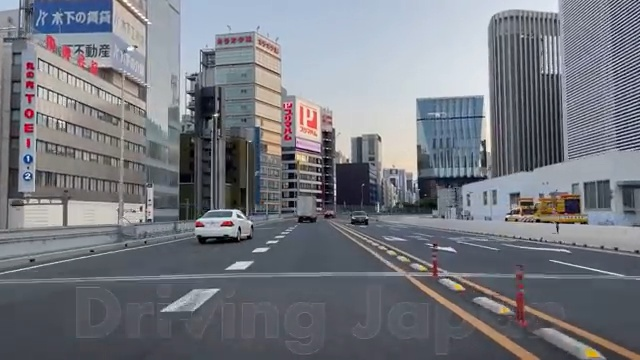

In [19]:
Image('frame_saved.jpg')

In [39]:
saved=cv2.imread('saved.jpg',0)
saved=cv2.GaussianBlur(saved, (5, 5), 0)
_,mask=cv2.threshold(saved,250,255,cv2.THRESH_BINARY)
kernel = np.ones((3,3),np.uint8)

mask = cv2.dilate(mask,kernel,iterations = 50)

cv2.imshow('main2', saved)
cv2.imshow('main2', mask)
cv2.waitKey(0)
cv2.destroyAllWindows()

In [40]:
video=cv2.VideoCapture("C:/Users/azpow/Desktop/videoplayback.mp4")
video.set(cv2.CAP_PROP_POS_FRAMES,10000)

while True:
    ret,frame=video.read()
    framee = cv2.inpaint(frame, mask, 1, cv2.INPAINT_TELEA)
    cv2.imshow('main2', framee)
    if cv2.waitKey(1)&0xFF==ord('q'):
        break
    
video.release()
cv2.destroyAllWindows()

In [3]:

cap = cv2.VideoCapture(0)

def nothing(x):
    pass

cv2.namedWindow("Frame")
cv2.createTrackbar("quality", "Frame", 1, 100, nothing)

while True:
    _, frame = cap.read()
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

    quality = cv2.getTrackbarPos("quality", "Frame")
    quality = quality / 100 if quality > 0 else 0.01
    corners = cv2.goodFeaturesToTrack(gray, 100, quality, 20)

    if corners is not None:
        corners = np.int0(corners)

    for corner in corners:
        x, y = corner.ravel()
        cv2.circle(frame, (x, y), 10, (0, 0, 255), -1)
        cv2.imshow("Frame", frame)

    key = cv2.waitKey(1)
    if key == 27:
        break

cap.release()
cv2.destroyAllWindows()

In [15]:
cv2.destroyAllWindows()

feature matching

In [2]:
img1 = cv2.imread("Desktop/boat2.jpg",1)
gray=cv2.cvtColor(img1,cv2.COLOR_BGR2GRAY)
sift = cv2.SIFT_create()
kp,des = sift.detectAndCompute(gray,None)
img=cv2.drawKeypoints(img1,kp,None)
cv2.imshow("Image1", img)
cv2.waitKey(0)
cv2.destroyAllWindows()

In [3]:

refFilename = "Desktop/form.jpg"
im1 = cv2.imread(refFilename, cv2.IMREAD_COLOR)
im1 = cv2.cvtColor(im1, cv2.COLOR_BGR2RGB)

imFilename = "Desktop/scanned-form.jpg"
im2 = cv2.imread(imFilename, cv2.IMREAD_COLOR)
im2 = cv2.cvtColor(im2, cv2.COLOR_BGR2RGB)
im1_gray = cv2.cvtColor(im1, cv2.COLOR_BGR2GRAY)
im2_gray = cv2.cvtColor(im2, cv2.COLOR_BGR2GRAY)
cv2.imshow('im1',im1)
cv2.imshow('im2',im2)
cv2.imshow('im3',im1_gray)
cv2.imshow('im4',im2_gray)
cv2.waitKey(0)
cv2.destroyAllWindows()

In [5]:
orb=cv2.ORB_create()
kp1,des1 = orb.detectAndCompute(im1_gray,None)
kp2,des2 = orb.detectAndCompute(im2_gray,None)
img1=cv2.drawKeypoints(im1_gray,kp1,None)
img2=cv2.drawKeypoints(im2_gray,kp2,None)
bf=cv2.BFMatcher(cv2.NORM_HAMMING,crossCheck=True)
matches=bf.match(des1,des2)
matches=sorted(matches,key=lambda x: x.distance, reverse=False)
#for m in matches[5]
#    print(m.distance)
im_matches = cv2.drawMatches(im1_gray, kp1, im2_gray, kp2, matches[:20], None)
cv2.imshow('im1',img1)
cv2.imshow('im2',img2)
cv2.imshow('im3',im_matches)
cv2.waitKey(0)
cv2.destroyAllWindows()

In [28]:
pts = [p.pt for p in kp1]

In [30]:
pts[:10]

[(50.0, 319.0),
 (166.0, 61.0),
 (89.0, 773.0),
 (529.0, 57.0),
 (83.0, 927.0),
 (215.0, 62.0),
 (510.0, 57.0),
 (64.0, 131.0),
 (51.0, 960.0),
 (110.0, 768.0)]

In [31]:
pts0 = cv2.KeyPoint.convert(kp1).reshape(-1, 1, 2)
pts0[:10]

array([[[ 50., 319.]],

       [[166.,  61.]],

       [[ 89., 773.]],

       [[529.,  57.]],

       [[ 83., 927.]],

       [[215.,  62.]],

       [[510.,  57.]],

       [[ 64., 131.]],

       [[ 51., 960.]],

       [[110., 768.]]], dtype=float32)

In [32]:
pts1 = np.asarray([[p.pt[0], p.pt[1]] for p in kp1])
pts1[:10]

array([[ 50., 319.],
       [166.,  61.],
       [ 89., 773.],
       [529.,  57.],
       [ 83., 927.],
       [215.,  62.],
       [510.,  57.],
       [ 64., 131.],
       [ 51., 960.],
       [110., 768.]])

In [48]:
    src_pts = np.float32([ kp1[m.queryIdx].pt for m in matches ]).reshape(-1,1,2)[5:9]
    dst_pts = np.float32([ kp2[m.trainIdx].pt for m in matches ]).reshape(-1,1,2)[5:9]


In [53]:
points1 = np.zeros((len(matches), 2), dtype=np.float32)
points2 = np.zeros((len(matches), 2), dtype=np.float32)

for i, match in enumerate(matches):
  points1[i, :] = kp1[match.queryIdx].pt
  points2[i, :] = kp2[match.trainIdx].pt
  

In [57]:
 M, mask = cv2.findHomography(points2, points1, cv2.RANSAC,5.0)

In [58]:
height, width, channels = im1.shape
im2_reg = cv2.warpPerspective(im2, M, (width, height))

In [59]:
cv2.imshow('im4',im2_reg)
cv2.waitKey(0)
cv2.destroyAllWindows()

In [2]:
img = cv2.imread("Desktop/cover.jpg",1)
gray=cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
sift = cv2.SIFT_create()
kp1,des1 = sift.detectAndCompute(gray,None)
img1=cv2.drawKeypoints(img,kp1,None)
FLANN_INDEX_KDTREE = 1
index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)
search_params = dict(checks=50)   # or pass empty dictionary
flann = cv2.FlannBasedMatcher(index_params, search_params)
cap=cv2.VideoCapture(0)
MIN_MATCH_COUNT=10
while True:
    ret,frame=cap.read()
    frame_gray=cv2.cvtColor(frame,cv2.COLOR_BGR2GRAY)
    kp2,des2 = sift.detectAndCompute(frame_gray,None)
    img_frame=cv2.drawKeypoints(frame,kp2,None)
    matches = flann.knnMatch(des1,des2,k=2)

    good = []
    for m,n in matches:
        if m.distance < 0.7*n.distance:
            good.append(m)

    if len(good)>MIN_MATCH_COUNT:
        src_pts = np.float32([ kp1[m.queryIdx].pt for m in good ]).reshape(-1,1,2)
        dst_pts = np.float32([ kp2[m.trainIdx].pt for m in good ]).reshape(-1,1,2)

        M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC,5.0)

        matchesMask = mask.ravel().tolist()
        h, w, d = img.shape
        pts = np.float32([ [0,0],[0,h-1],[w-1,h-1],[w-1,0] ]).reshape(-1,1,2)

        dst = cv2.perspectiveTransform(pts,M)
        img2 = cv2.polylines(frame,[np.int32(dst)],True,255,3, cv2.LINE_AA)
        cv2.imshow("frame",img2)
    else:
        print( "Not enough matches are found - {}/{}".format(len(good), MIN_MATCH_COUNT) )
        matchesMask = None
   
    key=cv2.waitKey(1)
    if key&0xFF==ord('q'):
        break
cap.release()        
cv2.destroyAllWindows()

Not enough matches are found - 7/10


In [10]:
def mouse(event,x,y, flags,params):
    if event==cv2.EVENT_LBUTTONDOWN:
        circles.append((x,y))

cv2.namedWindow('img')
cv2.setMouseCallback('img', mouse)
cap=cv2.VideoCapture(0)
circles=[]
while True:
    ret,frame=cap.read()
  
    for pos in circles:
        cv2.circle(frame,pos,5,(0,0,255),-1)
    cv2.imshow('img', frame)
    key=cv2.waitKey(1)
    if key&0xFF==ord('q'):
        break
cap.release()        
cv2.destroyAllWindows()        
    

In [10]:

point1=()
point2=()
draw=False
def mouse(event,x,y, flags,params):
    global point1, point2, draw
    if event==cv2.EVENT_LBUTTONDOWN:
        if draw==False:
            draw=True
            point1=(x,y)
        else:
            draw=False
            
    elif event==cv2.EVENT_MOUSEMOVE:
        if draw==True:
           point2=(x,y)
        


cv2.namedWindow('img')
cv2.setMouseCallback('img', mouse)
cap=cv2.VideoCapture(0)
while True:
    ret,frame=cap.read()
    if point1 and point2:
       cv2.rectangle(frame,point1,point2,(0,0,255),3)
  

    cv2.imshow('img', frame)
    key=cv2.waitKey(1)
    if key&0xFF==ord('q'):
        break
cap.release()        
cv2.destroyAllWindows()  

In [6]:
cv2.destroyAllWindows()  

In [13]:

original_image = cv2.imread("C:/Users/azpow/Desktop/goalkeeper.jpg")
hsv_original = cv2.cvtColor(original_image, cv2.COLOR_BGR2HSV)

roi = cv2.imread("C:/Users/azpow/Desktop/pitch_ground.jpg")
hsv_roi = cv2.cvtColor(roi, cv2.COLOR_BGR2HSV)

hue, saturation, value = cv2.split(hsv_roi)
roi_hist = cv2.calcHist([hsv_roi], [0, 1], None, [180, 256], [0, 180, 0, 256])
mask = cv2.calcBackProject([hsv_original], [0, 1], roi_hist, [0, 180, 0, 256], 1)
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5))
mask = cv2.filter2D(mask, -1, kernel)
_, mask = cv2.threshold(mask, 100, 255, cv2.THRESH_BINARY)

mask = cv2.merge((mask, mask, mask))
result = cv2.bitwise_and(original_image, mask)

cv2.imshow("Mask", mask)
cv2.imshow("Original image", original_image)
cv2.imshow("Result", result)
cv2.waitKey(0)
cv2.destroyAllWindows()


In [11]:
hist = cv2.calcHist([hsv_roi], [1], None, [180], [0, 180])

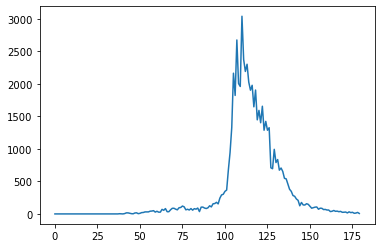

In [12]:
plt.plot(hist)

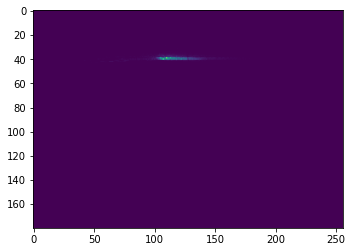

In [10]:
plt.imshow(roi_hist)

In [55]:
cap=cv2.VideoCapture(0)
while True:
    ret,frame=cap.read()
    kernel= np.array([
      [-1, -1, -1],
      [-1, 9, -1],
      [-1, -1, -1]
    ])
    frame=cv2.filter2D(frame, -1, kernel)
    cv2.imshow('frame', frame)
    key=cv2.waitKey(1)&0xFF
    if key==27:
        break
cv2.destroyAllWindows()
cap.release()

mean-shift

In [24]:
cap=cv2.VideoCapture(0)
n=0
while True:
    ret,frame=cap.read()
    n+=1
    if ret==False:
        break
    if n==300:
        cv2.imwrite('frame2.jpg',frame)
    cv2.imshow('frame', frame)
    key=cv2.waitKey(1)&0xFF
    if key==27:
        break
cv2.destroyAllWindows()
cap.release()

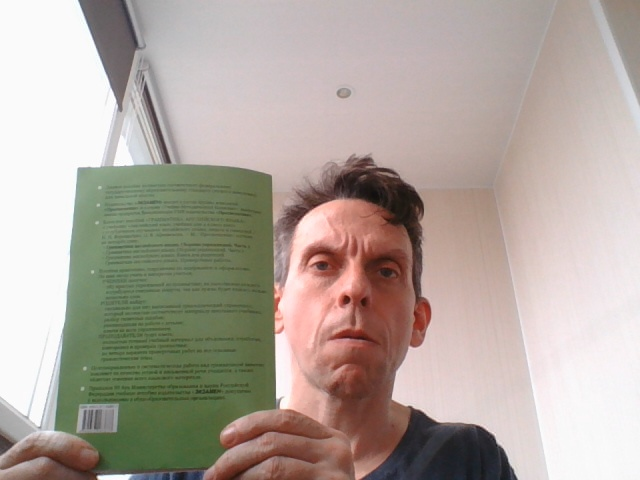

In [25]:
Image('frame2.jpg')

In [26]:
img = cv2.imread("frame2.jpg")
cv2.imshow("Result", img)
cv2.waitKey(0)
cv2.destroyAllWindows()

In [50]:
cap=cv2.VideoCapture(0)
x=67
y=125
height=400
width=210
roi=img[y:y+height, x:x+width]
hsv_roi=cv2.cvtColor(roi,cv2.COLOR_BGR2HSV)
hue, saturation, value = cv2.split(hsv_roi)
roi_hist = cv2.calcHist([hsv_roi], [0], None, [180], [0, 180])
term_criteria=(cv2.TERM_CRITERIA_EPS |cv2.TERM_CRITERIA_COUNT,10,1)

while True:
    ret,frame=cap.read()
    hsv=cv2.cvtColor(frame,cv2.COLOR_BGR2HSV)
    mask = cv2.calcBackProject([hsv], [0], roi_hist, [0, 180], 1)
    _, track_window = cv2.meanShift(mask, (x, y, width, height), term_criteria)
    x, y, w, h = track_window
    cv2.rectangle(frame,(x,y),(x+w,y+h),(0,255,0),2)
    if ret==False:
        break
    cv2.imshow('frame3', roi)
    cv2.imshow('frame', mask)
    cv2.imshow('frame2', frame)
    key=cv2.waitKey(50)&0xFF
    if key==27:
        break
cv2.destroyAllWindows()
cap.release()

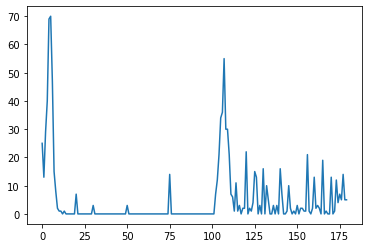

In [28]:
plt.plot(roi_hist)

In [40]:
cv2.destroyAllWindows()

In [ ]:
camshift

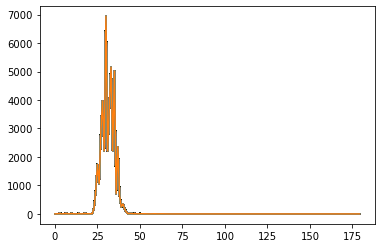

In [30]:
img = cv2.imread("frame2.jpg")
roi=img[168:400,80:265]
x=80
y=168
height=300
width=185
hsv_roi=cv2.cvtColor(roi,cv2.COLOR_BGR2HSV)
hist=cv2.calcHist([hsv_roi],[0],None,[180],[0,256])
term_criteria=(cv2.TERM_CRITERIA_EPS |cv2.TERM_CRITERIA_COUNT,10,1)
cap=cv2.VideoCapture(0)
while True:
    ret,frame=cap.read()
    hsv=cv2.cvtColor(frame,cv2.COLOR_BGR2HSV)
    mask = cv2.calcBackProject([hsv], [0], hist, [0, 180], 1)
    ret,track_window=cv2.CamShift(mask, (x, y, width, height), term_criteria)
    pts=np.int0(cv2.boxPoints(ret))
    cv2.polylines(frame,[pts],True,(255,0,0),2)
    cv2.imshow('frame', frame)
    cv2.imshow('frame1', mask)
    plt.plot(hist)
    
    key=cv2.waitKey(1)&0xFF
    if key==27:
        break
cv2.destroyAllWindows()
cap.release()

In [32]:
track_window

(62, 0, 200, 314)

lucas canade

In [67]:
cap=cv2.VideoCapture(0)
ret,frame=cap.read()
old_gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
lk_params = dict(winSize = (15, 15),
maxLevel = 4,
criteria = (cv2.TERM_CRITERIA_EPS | cv2.TERM_CRITERIA_COUNT, 10, 0.03))

def mouse(event,x,y,flags,params):
    global point,point_selected,old_points
    if event==cv2.EVENT_LBUTTONDOWN:
        point=(x,y)
        point_selected=True
        old_points = np.array([[x, y]], dtype=np.float32)
cv2.namedWindow('img')

point_selected=False
point=()
old_points = np.array([[]])
cv2.setMouseCallback('img', mouse)
while True:
    ret,frame=cap.read()
    gray_frame = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    if point_selected==True:
        cv2.circle(frame,point,5,(0,255,0),2)
        new_points, status, error = cv2.calcOpticalFlowPyrLK(old_gray, gray_frame, old_points, None, **lk_params)
        old_gray = gray_frame.copy()
        old_points = new_points
        x, y = new_points.ravel()
        cv2.circle(frame,(np.int0(x),np.int0(y)),5,(255,0,0),-1)
    cv2.imshow('img', frame)
    
    key=cv2.waitKey(1)&0xFF
    if key==27:
        break
cv2.destroyAllWindows()
cap.release()

In [63]:
cv2.destroyAllWindows()

In [54]:
cap.release()

subtraction


In [29]:
cap=cv2.VideoCapture("C:/Users/azpow/Desktop/Motorway.mp4")
ret,first_frame=cap.read()
first_gray=cv2.cvtColor(first_frame,cv2.COLOR_BGR2GRAY)
first_gray==cv2.GaussianBlur(first_gray,(5,5),0)
while True:
    ret,frame=cap.read()
    gray_frame=cv2.cvtColor(frame,cv2.COLOR_BGR2GRAY)
    gray_frame=cv2.GaussianBlur(gray_frame,(5,5),0)
    diff=cv2.absdiff(first_gray,gray_frame)
    _,thresh=cv2.threshold(diff,20,255,cv2.THRESH_BINARY)
    cv2.imshow('frame1', first_frame)
    cv2.imshow('frame2', thresh)
    cv2.imshow('frame', frame)
    key=cv2.waitKey(30)&0xFF
    if key==ord("q"):
        break
cv2.destroyAllWindows()
cap.release()

In [35]:
cap=cv2.VideoCapture("C:/Users/azpow/Desktop/Motorway.mp4")
subtr=cv2.createBackgroundSubtractorMOG2(history=50,varThreshold=25)
while True:
    ret,frame=cap.read()
    mask=subtr.apply(frame)
    cv2.imshow('frame', frame)
    cv2.imshow('frame1', mask)
    key=cv2.waitKey(30)&0xFF
    if key==ord("q"):
        break
cv2.destroyAllWindows()
cap.release()

In [9]:
imagefiles = glob.glob("Desktop/boat/*")
for  filename in imagefiles:
    img=cv2.imread(filename,0)
    f=np.fft.fft2(img)
    fshift=np.fft.fftshift(f)
    mag=20*np.log(np.abs(fshift))
    mag=np.asarray(mag,dtype=np.uint8)
    cv2.imshow(filename,mag)
    #print(filename)
cv2.waitKey(0)
cv2.destroyAllWindows()
